<a href="https://colab.research.google.com/github/maramatef111/Image_caption_project/blob/main/Image_caption_project/Image_caption_project%20/image_caption_using_Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd '/content/drive/MyDrive/image_caption'

/content/drive/MyDrive/image_caption


In [ ]:
!pwd

/content/drive/MyDrive/image_caption


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle(1).json ~/.kaggle/

/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `cp kaggle(1).json ~/.kaggle/'


In [ ]:
import os
os.environ["KAGGLE_CONFIG_DIR"] = "/content/drive/MyDrive/image_caption"

In [ ]:
!kaggle datasets download -d awsaf49/coco-2017-dataset

Dataset URL: https://www.kaggle.com/datasets/awsaf49/coco-2017-dataset
License(s): CC-BY-SA-4.0
100% 25.0G/25.0G [07:54<00:00, 66.5MB/s]
100% 25.0G/25.0G [07:54<00:00, 56.6MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/image_caption/coco-2017-dataset.zip', 'r')
zip_ref.extractall('/content/drive/MyDrive/image_caption')
zip_ref.close()

In [ ]:
import tensorflow as tf
import os
import json
import pandas as pd
import re
import numpy as np
import time
import matplotlib.pyplot as plt
import collections
import random
import requests
import json
from math import sqrt
from PIL import Image
from tqdm.auto import tqdm

In [ ]:
import os

# Define the path to the directory containing the images
image_dir = '/content/drive/MyDrive/image_caption/coco2017/train2017'

# Initialize an empty list to store image-caption pairs
img_cap_pairs = []

# Load annotations from JSON file
with open('/content/drive/MyDrive/image_caption/coco2017/annotations/captions_train2017.json', 'r') as f:
    data = json.load(f)
    data = data['annotations']

# Iterate over the annotations
for sample in data:
    img_name = '%012d.jpg' % sample['image_id']
    img_path = os.path.join(image_dir, img_name)
    # Check if the image file exists before adding it to img_cap_pairs
    if os.path.exists(img_path):
        img_cap_pairs.append([img_name, sample['caption']])

# Convert the list of image-caption pairs to a DataFrame
captions = pd.DataFrame(img_cap_pairs, columns=['image', 'caption'])

# Update the image paths in the DataFrame
captions['image'] = captions['image'].apply(lambda x: os.path.join(image_dir, x))

# Sample 70000 captions
captions = captions.sample(70000)

# Reset the index of the DataFrame
captions = captions.reset_index(drop=True)

# Display the first few rows of the DataFrame
captions.head()

,image,caption
0,/content/drive/MyDrive/image_caption/coco2017/...,"A view of two trucks, one with a man in the re..."
1,/content/drive/MyDrive/image_caption/coco2017/...,A small brown and white dog standing next to a...
2,/content/drive/MyDrive/image_caption/coco2017/...,a person riding a skate board at a skate park
3,/content/drive/MyDrive/image_caption/coco2017/...,A white food truck parked on the side of a road.
4,/content/drive/MyDrive/image_caption/coco2017/...,The green vehicle is parked in the driveway.


In [ ]:
def preprocess(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation marks and special characters
    text = re.sub(r'[^\w\s]', '', text)
    # Replace multiple whitespace characters with a single space
    text = re.sub('\s+', ' ', text)
     # Remove leading and trailing whitespaces (such as spaces, tabs, and newline characters)
    text = text.strip()
     # Add special tokens to mark the start and end of the sentence
    text = '[start] ' + text + ' [end]'
    return text

In [ ]:
captions['caption'] = captions['caption'].apply(preprocess)
captions.head()

,image,caption
0,/content/drive/MyDrive/image_caption/coco2017/...,[start] a view of two trucks one with a man in...
1,/content/drive/MyDrive/image_caption/coco2017/...,[start] a small brown and white dog standing n...
2,/content/drive/MyDrive/image_caption/coco2017/...,[start] a person riding a skate board at a ska...
3,/content/drive/MyDrive/image_caption/coco2017/...,[start] a white food truck parked on the side ...
4,/content/drive/MyDrive/image_caption/coco2017/...,[start] the green vehicle is parked in the dri...


[start] a man surfing a nice wave on a bright day with a ship in the background [end]

/content/drive/MyDrive/image_caption/coco2017/train2017/000000544738.jpg


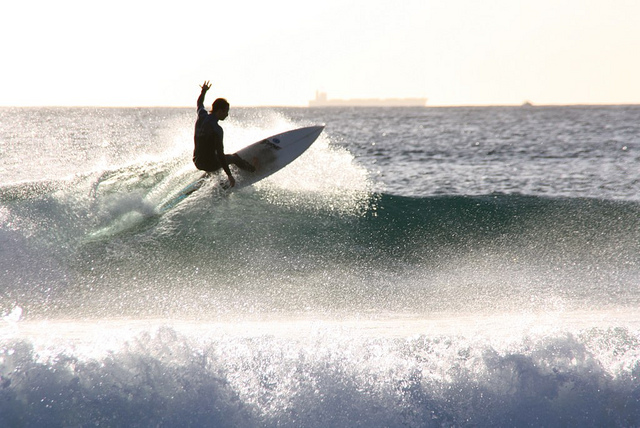

In [ ]:
# Sample a random row from the 'captions' DataFrame
random_row = captions.sample(1).iloc[0]
# Print the caption of the sampled row
print(random_row.caption)
print()
# Open the image corresponding to the sampled row's 'image' column
print(random_row.image)
im = Image.open(random_row.image)
im

In [ ]:
MAX_LENGTH = 40
VOCABULARY_SIZE = 15000
BATCH_SIZE = 64
BUFFER_SIZE = 1000
EMBEDDING_DIM = 512
UNITS = 512
EPOCHS = 5

In [ ]:
# Initialize a TextVectorization layer with specified parameters
tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=VOCABULARY_SIZE,           # Maximum number of tokens in the vocabulary
    standardize=None,                      # No standardization is applied to the text
    output_sequence_length=MAX_LENGTH)       # Maximum length of output sequences

tokenizer.adapt(captions['caption'])

In [ ]:
tokenizer.vocabulary_size()

11907

In [ ]:
import pickle
# Use pickle to dump  the vocabulary of the tokenizer
pickle.dump(tokenizer.get_vocabulary(), open('vocab_coco.file', 'wb'))

In [ ]:
# Create a StringLookup layer to map words to index
word2idx = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())       # Vocabulary for mapping words to index
# Create a StringLookup layer to map index to words
idx2word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)       #indicating that the layer should perform the inverse mapping (from index to words). When "invert=True"

In [ ]:
#This is a defaultdict where each image filename is mapped to a list of its corresponding captions.
img_to_cap_vector = collections.defaultdict(list)
# Iterate through each image-caption pair in the captions DataFrame
for img, cap in zip(captions['image'], captions['caption']):
   # Append the caption to the list associated with the image
    img_to_cap_vector[img].append(cap)
# Obtain the list of keys (image filenames) from the defaultdict
img_keys = list(img_to_cap_vector.keys())
# Shuffle the list of keys to randomize the order
random.shuffle(img_keys)
 #Calculate the index to split the keys into training and validation sets (80% for training, 20% for validation)
slice_index = int(len(img_keys)*0.8)
# Split the list of keys into training and validation keys based on the slice index
img_name_train_keys, img_name_val_keys = (img_keys[:slice_index],
                                          img_keys[slice_index:])

train_imgs = []         # List to store image filenames for training
train_captions = []     # List to store captions for training
# Iterate through image filenames in the training keys
for imgt in img_name_train_keys:
     # Get the number of captions associated with the current image
    capt_len = len(img_to_cap_vector[imgt])
 # Extend the train_imgs list with the current image filename repeated capt_len times
    train_imgs.extend([imgt] * capt_len)
# Extend the train_captions list with all captions associated with the current image
    train_captions.extend(img_to_cap_vector[imgt])

val_imgs = []
val_captions = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    val_imgs.extend([imgv] * capv_len)
    val_captions.extend(img_to_cap_vector[imgv])


In [ ]:
len(train_imgs), len(train_captions), len(val_imgs), len(val_captions)

(56046, 56046, 13954, 13954)

In [ ]:
def load_data(img_path, caption):
 # Read the image file from the provided path
    img = tf.io.read_file(img_path)
 # Decode the JPEG image into a tensor with 3 color channels (RGB)
    img = tf.io.decode_jpeg(img, channels=3)
 # Resize the image to a fixed size
    img = tf.keras.layers.Resizing(299, 299)(img)
# Preprocess the image according to the requirements of the InceptionV3 model
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    caption = tokenizer(caption)
# Return the preprocessed image tensor and the tokenized caption
    return img, caption


In [ ]:

# Create a TensorFlow dataset from the training image filenames and captions
train_dataset = tf.data.Dataset.from_tensor_slices(
    (train_imgs, train_captions))
# Apply the load_data function to each element of the dataset in parallel
# num_parallel_calls=tf.data.AUTOTUNE enables automatic parallelism
train_dataset = train_dataset.map(
    load_data, num_parallel_calls=tf.data.AUTOTUNE
    ).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
#same for validation
val_dataset = tf.data.Dataset.from_tensor_slices(
    (val_imgs, val_captions))

val_dataset = val_dataset.map(
    load_data, num_parallel_calls=tf.data.AUTOTUNE
    ).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


In [ ]:
image_augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomContrast(0.3),
    ]
)

In [ ]:

def CNN_Encoder():
  # Initialize InceptionV3 model without top layers and load pre-trained ImageNet weights
    inception_v3 = tf.keras.applications.InceptionV3(
        include_top=False,
        weights='imagenet'
    )
# Retrieve output tensor from InceptionV3 model
    output = inception_v3.output
 # Reshape output tensor to make it suitable for preprocessing
    output = tf.keras.layers.Reshape(
        (-1, output.shape[-1]))(output)
 # Create a new model with InceptionV3 input and reshaped output
    cnn_model = tf.keras.models.Model(inception_v3.input, output)
    return cnn_model


In [ ]:
class TransformerEncoderLayer(tf.keras.layers.Layer):

    def __init__(self, embed_dim, num_heads):
        super().__init__()
        # initialized to normalize the inputs and outputs
        self.layer_norm_1 = tf.keras.layers.LayerNormalization()
        self.layer_norm_2 = tf.keras.layers.LayerNormalization()
        #is initialized to perform multi-head self-attention.
        self.attention = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim)
        self.dense = tf.keras.layers.Dense(embed_dim, activation="relu")

    def call(self, x, training):
      # Apply layer normalization to the input
        x = self.layer_norm_1(x)
         # Feedforward neural network layer
        x = self.dense(x)

        attn_output = self.attention(
            query=x,
            value=x,
            key=x,
            attention_mask=None,
            training=training
        )

        x = self.layer_norm_2(x + attn_output)
        return x


In [ ]:
class Embeddings(tf.keras.layers.Layer):

    def __init__(self, vocab_size, embed_dim, max_len):
        super().__init__()
        # Token embeddings layer
        self.token_embeddings = tf.keras.layers.Embedding(
            vocab_size, embed_dim)
         # Position embeddings layer
        self.position_embeddings = tf.keras.layers.Embedding(
            max_len, embed_dim, input_shape=(None, max_len))

    def call(self, input_ids):
      # Determine the length of the input sequence
        length = tf.shape(input_ids)[-1]
        # Generate position IDs for the input sequence
        position_ids = tf.range(start=0, limit=length, delta=1)
        position_ids = tf.expand_dims(position_ids, axis=0)
         # Generate token embeddings
        token_embeddings = self.token_embeddings(input_ids)
        # Generate position embeddings
        position_embeddings = self.position_embeddings(position_ids)
        # Combine token and position embeddings
        return token_embeddings + position_embeddings


In [ ]:
class TransformerDecoderLayer(tf.keras.layers.Layer):

    def __init__(self, embed_dim, units, num_heads):
        super().__init__()
        self.embedding = Embeddings(
            tokenizer.vocabulary_size(), embed_dim, MAX_LENGTH)

        self.attention_1 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.attention_2 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
         # Layer normalization layers
        self.layernorm_1 = tf.keras.layers.LayerNormalization()
        self.layernorm_2 = tf.keras.layers.LayerNormalization()
        self.layernorm_3 = tf.keras.layers.LayerNormalization()
         # Feedforward neural network layers
        self.ffn_layer_1 = tf.keras.layers.Dense(units, activation="relu")
        self.ffn_layer_2 = tf.keras.layers.Dense(embed_dim)
        # Output layer
        self.out = tf.keras.layers.Dense(tokenizer.vocabulary_size(), activation="softmax")
        # Dropout layers
        self.dropout_1 = tf.keras.layers.Dropout(0.3)
        self.dropout_2 = tf.keras.layers.Dropout(0.5)

    def call(self, input_ids, encoder_output, training, mask=None):
        embeddings = self.embedding(input_ids)
         # Initialize combined and padding masks
        combined_mask = None
        padding_mask = None
        # If a mask is provided, create a combined mask
        if mask is not None:
          # Get causal attention mask for the input embeddings
            causal_mask = self.get_causal_attention_mask(embeddings)
            # Convert the mask to the required data type and dimensions
            padding_mask = tf.cast(mask[:, :, tf.newaxis], dtype=tf.int32)
            combined_mask = tf.cast(mask[:, tf.newaxis, :], dtype=tf.int32)
            # Combine the padding and causal masks
            combined_mask = tf.minimum(combined_mask, causal_mask)

        attn_output_1 = self.attention_1(
            query=embeddings,
            value=embeddings,
            key=embeddings,
             attention_mask=combined_mask,
            training=training
        )

        out_1 = self.layernorm_1(embeddings + attn_output_1)

        attn_output_2 = self.attention_2(
            query=out_1,
              value=encoder_output,
            key=encoder_output,
            attention_mask=padding_mask,
            training=training
        )

        out_2 = self.layernorm_2(out_1 + attn_output_2)

    # Feedforward neural network layers
        ffn_out = self.ffn_layer_1(out_2)
         # Apply dropout
        ffn_out = self.dropout_1(ffn_out, training=training)
        ffn_out = self.ffn_layer_2(ffn_out)
    # Residual connection and layer normalization
        ffn_out = self.layernorm_3(ffn_out + out_2)
     # Apply dropout
        ffn_out = self.dropout_2(ffn_out, training=training)
        # Generate predictions using output of the final layer
        preds = self.out(ffn_out)
        return preds

    def get_causal_attention_mask(self, inputs):
        input_shape = tf.shape(inputs)
        # Extract batch size and sequence length
        batch_size, sequence_length = input_shape[0], input_shape[1]
        i = tf.range(sequence_length)[:, tf.newaxis]
        j = tf.range(sequence_length)
        # Create a mask where each element is 1 if its row index is greater than or equal to its column index
        mask = tf.cast(i >= j, dtype="int32")
        # Reshape the mask to match the input shape
        mask = tf.reshape(mask, (1, input_shape[1], input_shape[1]))
        mult = tf.concat(
            [tf.expand_dims(batch_size, -1), tf.constant([1, 1], dtype=tf.int32)],
            axis=0
        )
        return tf.tile(mask, mult)


In [ ]:
class ImageCaptioningModel(tf.keras.Model):

    def __init__(self, cnn_model, encoder, decoder, image_aug=None):
        super().__init__()
        # Initialize the CNN model for image feature extraction
        self.cnn_model = cnn_model
        # Initialize the Transformer encoder
        self.encoder = encoder
        # Initialize the Transformer decoder
        self.decoder = decoder
        # Optional image augmentation module
        self.image_aug = image_aug
         # Initialize loss and accuracy trackers
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.acc_tracker = tf.keras.metrics.Mean(name="accuracy")

    def calculate_loss(self, y_true, y_pred, mask):
       # Calculate the loss using the specified loss function
        loss = self.loss(y_true, y_pred)
         # Apply the mask to the loss
        mask = tf.cast(mask, dtype=loss.dtype)
        loss *= mask
        return tf.reduce_sum(loss) / tf.reduce_sum(mask)

    def calculate_accuracy(self, y_true, y_pred, mask):
        # Determine whether the predicted labels match the true labels
        accuracy = tf.equal(y_true, tf.argmax(y_pred, axis=2))
        # Apply the mask to the accuracy calculation
        accuracy = tf.math.logical_and(mask, accuracy)
        # Convert accuracy values to floats
        accuracy = tf.cast(accuracy, dtype=tf.float32)
        mask = tf.cast(mask, dtype=tf.float32)
        # Calculate the accuracy by summing the correct predictions and dividing by the total number of non-masked elements
        return tf.reduce_sum(accuracy) / tf.reduce_sum(mask)
    def compute_loss_and_acc(self, img_embed, captions, training=True):
       # Encode the image embeddings
        encoder_output = self.encoder(img_embed, training=True)

        y_input = captions[:, :-1]
        y_true = captions[:, 1:]
         # Generate a mask to apply to the loss and accuracy calculations
        mask = (y_true != 0)
        y_pred = self.decoder(
            y_input, encoder_output, training=True, mask=mask
        )
        # Calculate the loss
        loss = self.calculate_loss(y_true, y_pred, mask)
        # Calculate the accuracy
        acc = self.calculate_accuracy(y_true, y_pred, mask)
        return loss, acc

    def train_step(self, batch):
       # Unpack the batch data into images and captions
        imgs, captions = batch
       # Apply image augmentation if specified
        if self.image_aug:
            imgs = self.image_aug(imgs)
        # Generate image embeddings using the CNN model
        img_embed = self.cnn_model(imgs)
       # Calculate the loss and accuracy for the current batch
        with tf.GradientTape() as tape:
          loss, acc = self.compute_loss_and_acc(
                img_embed, captions
            )
     # Compute gradients and apply them to update the trainable variables
        train_vars = (
            self.encoder.trainable_variables + self.decoder.trainable_variables
        )
        grads = tape.gradient(loss, train_vars)
        self.optimizer.apply_gradients(zip(grads, train_vars))
        # Update loss and accuracy trackers
        self.loss_tracker.update_state(loss)
        self.acc_tracker.update_state(acc)
        # Return loss and accuracy metrics for the current step
        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}



    def test_step(self, batch):
      # Unpack the batch data into images and captions
        imgs, captions = batch
     # Generate image embeddings using the CNN model
        img_embed = self.cnn_model(imgs)

        loss, acc = self.compute_loss_and_acc(
            img_embed, captions, training=False
        )
       # Update loss and accuracy trackers
        self.loss_tracker.update_state(loss)
        self.acc_tracker.update_state(acc)
      # Return loss and accuracy metrics for the current step
        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker, self.acc_tracker]


In [ ]:
# Initialize the Transformer encoder and decoder layers
encoder = TransformerEncoderLayer(EMBEDDING_DIM, 1)
decoder = TransformerDecoderLayer(EMBEDDING_DIM, UNITS, 8)
# Initialize the CNN model for image feature extraction
cnn_model = CNN_Encoder()
# Initialize the ImageCaptioningModel with the CNN model, encoder, and decoder
# Optionally, include an image augmentation module
caption_model = ImageCaptioningModel(
    cnn_model=cnn_model, encoder=encoder, decoder=decoder, image_aug=image_augmentation,
)


87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
# Define the cross-entropy loss function for sparse categorical labels
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=False, reduction="none"
)
# Define the early stopping callback to monitor validation loss and restore the best weights
early_stopping = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)
# Compile the caption_model with Adam optimizer and the defined cross-entropy loss
caption_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=cross_entropy
)


In [ ]:
history = caption_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=[early_stopping]
)

Epoch 1/5
876/876 [==============================] - 1044s 1s/step - loss: 4.3022 - acc: 0.2363 - val_loss: 3.5644 - val_acc: 0.3717
Epoch 2/5
876/876 [==============================] - 896s 1s/step - loss: 3.3818 - acc: 0.3774 - val_loss: 3.2952 - val_acc: 0.4012
Epoch 3/5
876/876 [==============================] - 894s 1s/step - loss: 3.1357 - acc: 0.4036 - val_loss: 3.1852 - val_acc: 0.4128
Epoch 4/5
876/876 [==============================] - 997s 1s/step - loss: 2.9947 - acc: 0.4182 - val_loss: 3.1437 - val_acc: 0.4177
Epoch 5/5
876/876 [==============================] - 951s 1s/step - loss: 2.8881 - acc: 0.4269 - val_loss: 3.1531 - val_acc: 0.4194


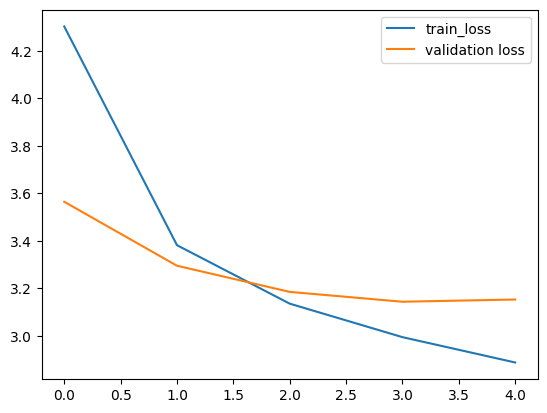

In [ ]:
# Plot the training and validation loss over epochs
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

In [ ]:
def load_image_from_path(img_path):
    # Read image file from the given path
    img = tf.io.read_file(img_path)
    # Decode JPEG-encoded image into a tensor with 3 channels
    img = tf.io.decode_jpeg(img, channels=3)
     # Resize the image to 299x299
    img = tf.keras.layers.Resizing(299, 299)(img)
    # Preprocess the image for InceptionV3 model
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img


def generate_caption(img_path, add_noise=False):
   # Load and preprocess the image from the given path
    img = load_image_from_path(img_path)
      # Optionally add noise to the image
    if add_noise:
        noise = tf.random.normal(img.shape)*0.1
        img = img + noise
        img = (img - tf.reduce_min(img))/(tf.reduce_max(img) - tf.reduce_min(img))

    # Expand dimensions to match model input shape
    img = tf.expand_dims(img, axis=0)
       # Extract image features using the CNN model
    img_embed = caption_model.cnn_model(img)

    # Encode image features using the Transformer encoder
    img_encoded = caption_model.encoder(img_embed, training=False)

    y_inp = '[start]'
    # Generate caption token by token
    for i in range(MAX_LENGTH-1):
       # Tokenize input caption and create mask
        tokenized = tokenizer([y_inp])[:, :-1]
        mask = tf.cast(tokenized != 0, tf.int32)
           # Generate next token prediction using the decoder
        pred = caption_model.decoder(
            tokenized, img_encoded, training=False, mask=mask)
         # Extract the index of the predicted token
        pred_idx = np.argmax(pred[0, i, :])
        pred_idx = tf.convert_to_tensor(pred_idx)
         # Decode the predicted token to a word
        pred_word = idx2word(pred_idx).numpy().decode('utf-8')
         # Check for end token and break if found
        if pred_word == '[end]':
            break

        y_inp += ' ' + pred_word
    # Remove the start token from the generated caption
    y_inp = y_inp.replace('[start] ', '')
    return y_inp

Predicted Caption: a clock on a pole with a clock on it



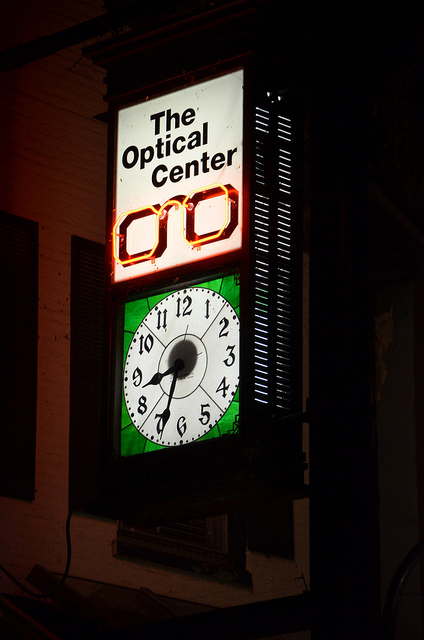

In [ ]:
# Select a random image from the dataset
idx = random.randrange(0, len(captions))
img_path = captions.iloc[idx].image
# Generate a caption for the selected image
pred_caption = generate_caption(img_path)
# Print the predicted caption
print('Predicted Caption:', pred_caption)
print()
# Display the selected image
Image.open(img_path)

Predicted Caption: a group of people on a beach with a surfboard



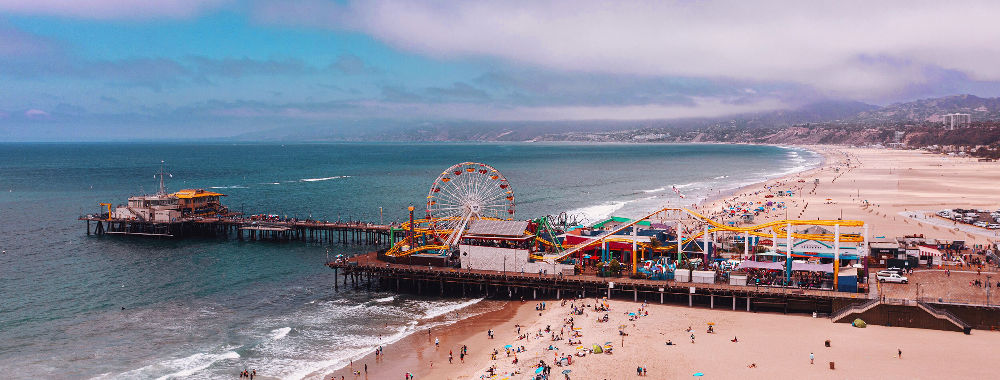

In [ ]:
# Define the URL of the image
img_url = "https://images.squarespace-cdn.com/content/v1/5e0e65adcd39ed279a0402fd/1627422658456-7QKPXTNQ34W2OMBTESCJ/1.jpg?format=2500w"

im = Image.open(requests.get(img_url, stream=True).raw)
# Convert the image to RGB format
im = im.convert('RGB')
# Save the image temporarily
im.save('tmp.jpg')
# Generate a caption for the saved image
pred_caption = generate_caption('tmp.jpg', add_noise=False)
print('Predicted Caption:', pred_caption)
print()
im

Predicted Caption: a cat sitting on a bed with a cat on it



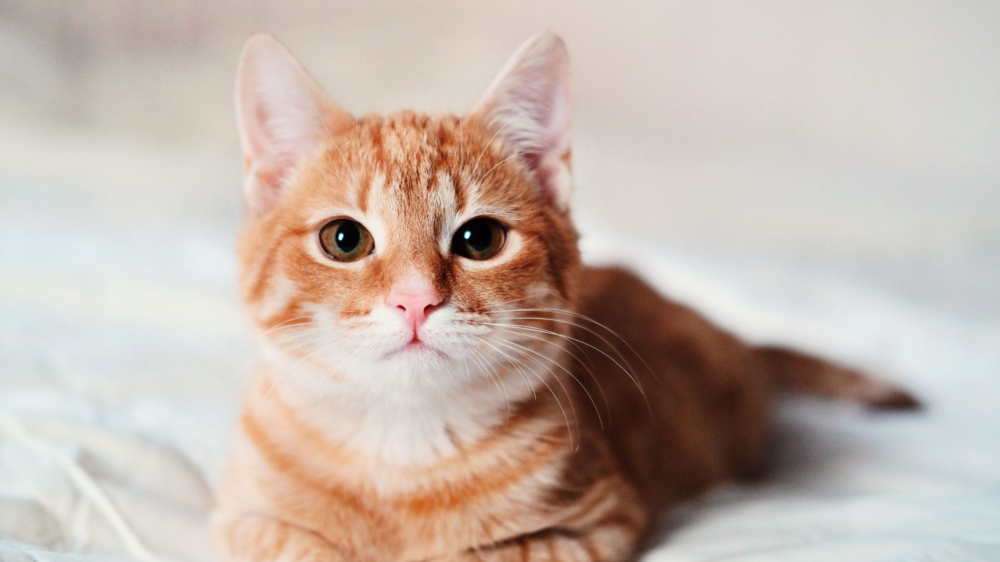

In [ ]:
img_url = "https://hips.hearstapps.com/hmg-prod/images/beautiful-smooth-haired-red-cat-lies-on-the-sofa-royalty-free-image-1678488026.jpg?crop=1xw:0.84415xh;center,top"

im = Image.open(requests.get(img_url, stream=True).raw)
im = im.convert('RGB')
im.save('tmp.jpg')

pred_caption = generate_caption('tmp.jpg', add_noise=False)
print('Predicted Caption:', pred_caption)
print()
im

Predicted Caption: a group of people standing on a field with a soccer ball



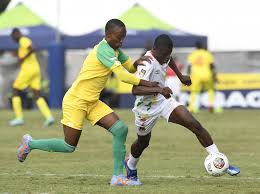

In [ ]:
img_url = "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRlhApYNfXC3aLm4OFfB8J95bv-i3Iw75zo-Q&s"

im = Image.open(requests.get(img_url, stream=True).raw)
im = im.convert('RGB')
im.save('tmp.jpg')

pred_caption = generate_caption('tmp.jpg', add_noise=False)
print('Predicted Caption:', pred_caption)
print()
im

Predicted Caption: a bird sitting on a branch in a tree



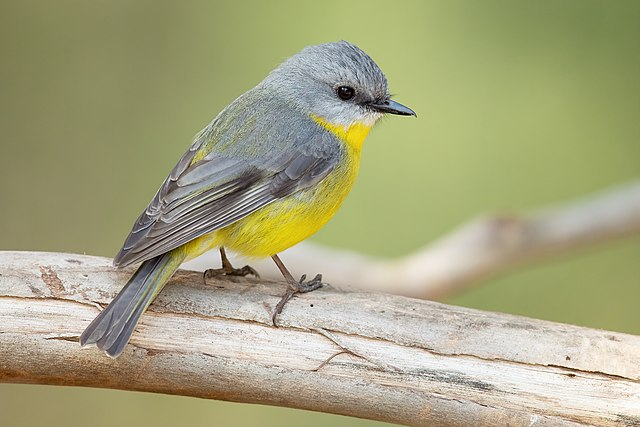

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/4/45/Eopsaltria_australis_-_Mogo_Campground.jpg/640px-Eopsaltria_australis_-_Mogo_Campground.jpg"

im = Image.open(requests.get(img_url, stream=True).raw)
im = im.convert('RGB')
im.save('tmp.jpg')

pred_caption = generate_caption('tmp.jpg', add_noise=False)
print('Predicted Caption:', pred_caption)
print()
im

Predicted Caption: a group of people sitting at a table eating food



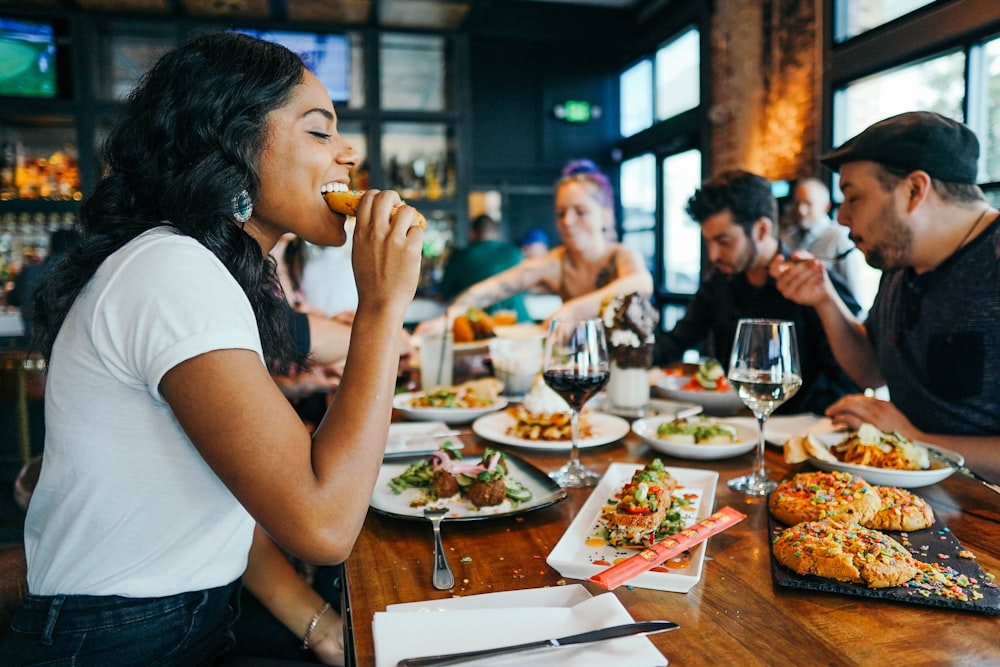

In [ ]:
img_url = "https://images.unsplash.com/photo-1592861956120-e524fc739696?q=80&w=1000&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8ZWF0aW5nJTIwcGVvcGxlfGVufDB8fDB8fHww"

im = Image.open(requests.get(img_url, stream=True).raw)
im = im.convert('RGB')
im.save('tmp.jpg')

pred_caption = generate_caption('tmp.jpg', add_noise=False)
print('Predicted Caption:', pred_caption)
print()
im